## Mounting google drive to notebook

In [ ]:
# from google.colab import drive
# drive.mount("/content/drive", force_remount=True)

In [ ]:
import pandas as pd
import numpy as np
import os

In [ ]:
%cd /content/drive/MyDrive/Data

/content/drive/MyDrive/Data


## Understanding the dataset

In [ ]:
data_dir = '/content/drive/MyDrive/Data'
train_dir = data_dir + '/TRAIN'
test_dir = data_dir + '/TEST'

In [ ]:
train_df=pd.read_csv('train_labels.csv')

In [ ]:
train_df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,cherry-tree-leaves-and-fruits.jpg,350,300,Cherry leaf,198,77,299,252
1,cherry-tree-leaves-and-fruits.jpg,350,300,Cherry leaf,3,114,148,235
2,cherry-tree-leaves-and-fruits.jpg,350,300,Cherry leaf,30,184,189,297
3,cherry-tree-leaves-and-fruits.jpg,350,300,Cherry leaf,226,4,346,83
4,peach-and-leaf-stock-image-2809275.jpg,1300,1099,Peach leaf,237,479,527,810


In [ ]:
train_df[train_df['class']=='Potato leaf']

,filename,width,height,class,xmin,ymin,xmax,ymax
2462,0042241.jpg,533,800,Potato leaf,198,298,298,419
2463,0042241.jpg,533,800,Potato leaf,219,255,340,324
2464,0042241.jpg,533,800,Potato leaf,266,186,348,263
2465,0042241.jpg,533,800,Potato leaf,380,447,514,565
2466,0042241.jpg,533,800,Potato leaf,265,499,363,641
2467,0042241.jpg,533,800,Potato leaf,175,142,287,227
2468,0042241.jpg,533,800,Potato leaf,290,103,393,189
6114,21-late%20blight-early%20symptoms%20potato.jpg,3072,2032,Potato leaf,589,974,1242,1940
6115,21-late%20blight-early%20symptoms%20potato.jpg,3072,2032,Potato leaf,1221,1025,2127,1778
6116,21-late%20blight-early%20symptoms%20potato.jpg,3072,2032,Potato leaf,827,93,1538,833


In [ ]:
test_df=pd.read_csv('test_labels.csv')

In [ ]:
test_df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,Black%20rot%20on%20foliage.jpg,1060,795,grape leaf black rot,1,58,859,732
1,pepper_leaf.jpg,300,400,Bell_pepper leaf,40,58,251,392
2,depositphotos_1323264-Raspberry-leaf-on-white.jpg,1024,772,Raspberry leaf,98,75,964,710
3,dscn6689.jpg,1024,768,Tomato mold leaf,140,102,887,712
4,IMG_1246.jpg,1600,1200,Tomato leaf,1,193,1522,1068


In [ ]:
classnames=[]
for i in train_df['class']:
  classnames.append(i)
classnames=list(set(classnames))

In [ ]:
classnamestest=[]
for i in test_df['class']:
  classnamestest.append(i)
classnamestest=list(set(classnamestest))

In [ ]:
classnames

['Tomato Early blight leaf',
 'Corn leaf blight',
 'Tomato leaf mosaic virus',
 'Tomato leaf late blight',
 'Potato leaf',
 'Tomato leaf',
 'Strawberry leaf',
 'grape leaf',
 'Peach leaf',
 'Corn rust leaf',
 'Bell_pepper leaf spot',
 'Tomato Septoria leaf spot',
 'Soyabean leaf',
 'Potato leaf early blight',
 'Cherry leaf',
 'Squash Powdery mildew leaf',
 'Bell_pepper leaf',
 'Tomato two spotted spider mites leaf',
 'Tomato leaf yellow virus',
 'Corn Gray leaf spot',
 'Potato leaf late blight',
 'Apple rust leaf',
 'Tomato mold leaf',
 'Apple Scab Leaf',
 'Apple leaf',
 'Blueberry leaf',
 'grape leaf black rot',
 'Tomato leaf bacterial spot',
 'Raspberry leaf']

In [ ]:
map={}
for i in classnames:
  map[i]=0
for i in train_df['class']:

  map[i]+=1
images_per_class = pd.DataFrame(map.values(), index = map.keys(), columns=["Number of Images"])
images_per_class

,Number of Images
Tomato Early blight leaf,195
Corn leaf blight,360
Tomato leaf mosaic virus,225
Tomato leaf late blight,207
Potato leaf,11
Tomato leaf,369
Strawberry leaf,462
grape leaf,205
Peach leaf,610
Corn rust leaf,117


In [ ]:
print('Total Number of classes available:',len(classnames))

Total Number of classes available: 29


In [ ]:
train_df[train_df['filename']=='01gb.jpg']

,filename,width,height,class,xmin,ymin,xmax,ymax
5993,01gb.jpg,479,441,grape leaf black rot,70,109,248,296


## Dataset Preparation

Moving all .xml files to "labels" folder of TRAIN folder and ".jpg" files to images folder of TRAIN

In [ ]:
# import os
# import shutil

# source = '/content/drive/MyDrive/Data/TRAIN'
# destination_images = '/content/drive/MyDrive/Data/images'
# destination_labels='/content/drive/MyDrive/Data/labels'

# # gather all files
# allfiles = os.listdir(source)

# # iterate on all files to move them to destination folder
# for f in allfiles:
#   if '.jpg' in f:
#     src_path = os.path.join(source, f)
#     dst_path = os.path.join(destination_images, f)
#     shutil.move(src_path, dst_path)
#   else:
#     src_path = os.path.join(source, f)
#     dst_path = os.path.join(destination_labels, f)
#     shutil.move(src_path, dst_path)


Moving all .xml files to "labels" folder of TEST folder and ".jpg" files to images folder of TEST

In [ ]:
# import os
# import shutil

# source = '/content/drive/MyDrive/Data/TEST'
# destination_images = '/content/drive/MyDrive/Data/images'
# destination_labels= '/content/drive/MyDrive/Data/labels'

# # gather all files
# allfiles = os.listdir(source)

# # iterate on all files to move them to destination folder
# for f in allfiles:
#   print(f)
#   if '.jpg' in f:
#     src_path = os.path.join(source, f)
#     dst_path = os.path.join(destination_images, f)
#     shutil.move(src_path, dst_path)
#   else:
#     src_path = os.path.join(source, f)
#     dst_path = os.path.join(destination_labels, f)
#     shutil.move(src_path, dst_path)

In [ ]:
# import os
# import shutil
# source='/content/drive/MyDrive/Data/TRAIN/images'
# destination='/content/drive/MyDrive/Data/TRAIN/labels'
# all=os.listdir(source)
# for f in all:
#   if '.xml' in f:
#     src=os.path.join(source,f)
#     dst=os.path.join(destination,f)
#     shutil.move(src,dst)

In [ ]:
# import os
# import shutil
# source='/content/drive/MyDrive/Data/TRAIN/labels'
# destination='/content/drive/MyDrive/Data/TRAIN/images'
# all=os.listdir(source)
# for f in all:
#   if '.jpg' in f and '.xml' not in f:
#     src=os.path.join(source,f)
#     dst=os.path.join(destination,f)
#     shutil.move(src,dst)

Removing the images that dont have the corresponding .xml file

In [ ]:
# file1='/content/drive/MyDrive/Data/TRAIN/images'
# file2='/content/drive/MyDrive/Data/TRAIN/labels'
# c=0
# for i in os.listdir(file1):
#   k=i
#   j=i[::-1].replace('gpj.','lmx.',1)[::-1]
#   if j not in os.listdir(file2):
#     os.remove(os.path.join(file1,i))

In [ ]:
# file1='/content/drive/MyDrive/Data/TRAIN/images'
# file2='/content/drive/MyDrive/Data/TRAIN/labels'
# c=0
# for i in os.listdir(file2):
#   k=i
#   j=i[::-1].replace('lmx.','gpj.',1)[::-1]
#   if j not in os.listdir(file1):
#     os.remove(os.path.join(file2,i))

Organising the TEST directory

In [ ]:
# import os
# import shutil
# source='/content/drive/MyDrive/Data/TEST/images'
# destination='/content/drive/MyDrive/Data/TEST/labels'
# all=os.listdir(source)
# for f in all:
#   if '.xml' in f:
#     src=os.path.join(source,f)
#     dst=os.path.join(destination,f)
#     shutil.move(src,dst)

In [ ]:
# import os
# import shutil
# source='/content/drive/MyDrive/Data/TEST/labels'
# destination='/content/drive/MyDrive/Data/TEST/images'
# all=os.listdir(source)
# for f in all:
#   if '.jpg' in f and '.xml' not in f:
#     src=os.path.join(source,f)
#     dst=os.path.join(destination,f)
#     shutil.move(src,dst)

In [ ]:
# file1='/content/drive/MyDrive/Data/TEST/images'
# file2='/content/drive/MyDrive/Data/TEST/labels'
# c=0
# for i in os.listdir(file1):
#   k=i
#   j=i[::-1].replace('gpj.','lmx.',1)[::-1]
#   if j not in os.listdir(file2):
#     os.remove(os.path.join(file1,i))

In [ ]:
# file1='/content/drive/MyDrive/Data/TEST/images'
# file2='/content/drive/MyDrive/Data/TEST/labels'
# c=0
# for i in os.listdir(file2):
#   k=i
#   j=i[::-1].replace('lmx.','gpj.',1)[::-1]
#   if j not in os.listdir(file1):
#     os.remove(os.path.join(file2,i))

In [ ]:
f='/content/drive/MyDrive/Data/TEST/labels'
print("Number of labels in test directory:",len(os.listdir(f)))

Number of labels in test directory: 236


In [ ]:
f='/content/drive/MyDrive/Data/TEST/images'
print("Number of images in test directory:",len(os.listdir(f)))

Number of images in test directory: 237


Number of images of each class in training images folder

In [ ]:
import os
file1='/content/drive/MyDrive/Data/TRAIN/images'
file2='/content/drive/MyDrive/Data/TRAIN/labels'

f1=os.listdir(file1)

m={}
for i in classnames:
  m[i]=0
for i in f1:
  k=list(train_df[train_df['filename']==i].index)
  for j in k:
    m[train_df.at[j,'class']]+=1
images = pd.DataFrame(m.values(), index = m.keys(), columns=["Number of Images"])
images



,Number of Images
Tomato Early blight leaf,187
Corn leaf blight,343
Tomato leaf mosaic virus,225
Tomato leaf late blight,206
Potato leaf,11
Tomato leaf,364
Strawberry leaf,440
grape leaf,192
Peach leaf,598
Corn rust leaf,111


Finding number of labels in training folder

In [ ]:
file='/content/drive/MyDrive/Data/TRAIN/labels'
c=0
for f in os.listdir(file):
  c+=1
print(c)

2329


Finding number of images in training folder

In [ ]:
file='/content/drive/MyDrive/Data/TRAIN/images'
c=0
for f in os.listdir(file):
  c+=1
print("Training images available:",c)

Training images available: 2339


## Data Visualisation

Resizing all the images to 640*640

In [ ]:
# def resize_image(src_img, size=(640,640), bg_color="white"):
#     from PIL import Image

#     # rescale the image so the longest edge is the right size
#     src_img.thumbnail(size, Image.ANTIALIAS)

#     # Create a new image of the right shape
#     new_image = Image.new("RGB", size, bg_color)

#     # Paste the rescaled image onto the new centered background
#     new_image.paste(src_img, (int((size[0] - src_img.size[0]) / 2), int((size[1] - src_img.size[1]) / 2)))

#     # return the resized image
#     return new_image


# # get the list of test image files
# test_folder = '/content/drive/My Drive/Data/TRAIN/images'
# test_image_files = os.listdir(test_folder)

# # Empty array on which to store the images
# image_arrays = []
# size = (640,640)
# background_color="white"

# # Get the images
# for file_idx in range(len(test_image_files)):
#     img = Image.open(os.path.join(test_folder, test_image_files[file_idx]))

#     # resize the image
#     resized_img = np.array(resize_image(img, size, background_color))

#     # Add the image to the array of images
#     image_arrays.append(resized_img)

In [ ]:
from PIL import Image

In [ ]:
def resize_image(src_img, size=(640,640), bg_color="white"):
    from PIL import Image

    # rescale the image so the longest edge is the right size
    src_img.thumbnail(size, Image.ANTIALIAS)

    # Create a new image of the right shape
    new_image = Image.new("RGB", size, bg_color)

    # Paste the rescaled image onto the new centered background
    new_image.paste(src_img, (int((size[0] - src_img.size[0]) / 2), int((size[1] - src_img.size[1]) / 2)))

    # return the resized image
    return new_image


# get the list of test image files
test_folder = '/content/drive/My Drive/Data/TEST/images'
test_image_files = os.listdir(test_folder)

# Empty array on which to store the images
image_arrays = []
size = (640,640)
background_color="white"

# Get the images
for file_idx in range(len(test_image_files)):
    img = Image.open(os.path.join(test_folder, test_image_files[file_idx]))

    # resize the image
    resized_img = np.array(resize_image(img, size, background_color))

    # Add the image to the array of images
    image_arrays.append(resized_img)

In [ ]:
import tensorflow as tf
from tensorflow.keras import models,layers
import matplotlib.pyplot as plt

In [ ]:
IMAGE_SIZE=640
BATCH_SIZE=32
CHANNELS=3
EPOCHS=50

In [ ]:
dataset_train=tf.keras.preprocessing.image_dataset_from_directory(
    '/content/drive/MyDrive/Data/TRAIN',
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE

)

Found 2339 files belonging to 3 classes.


In [ ]:
resize_rescale=tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])

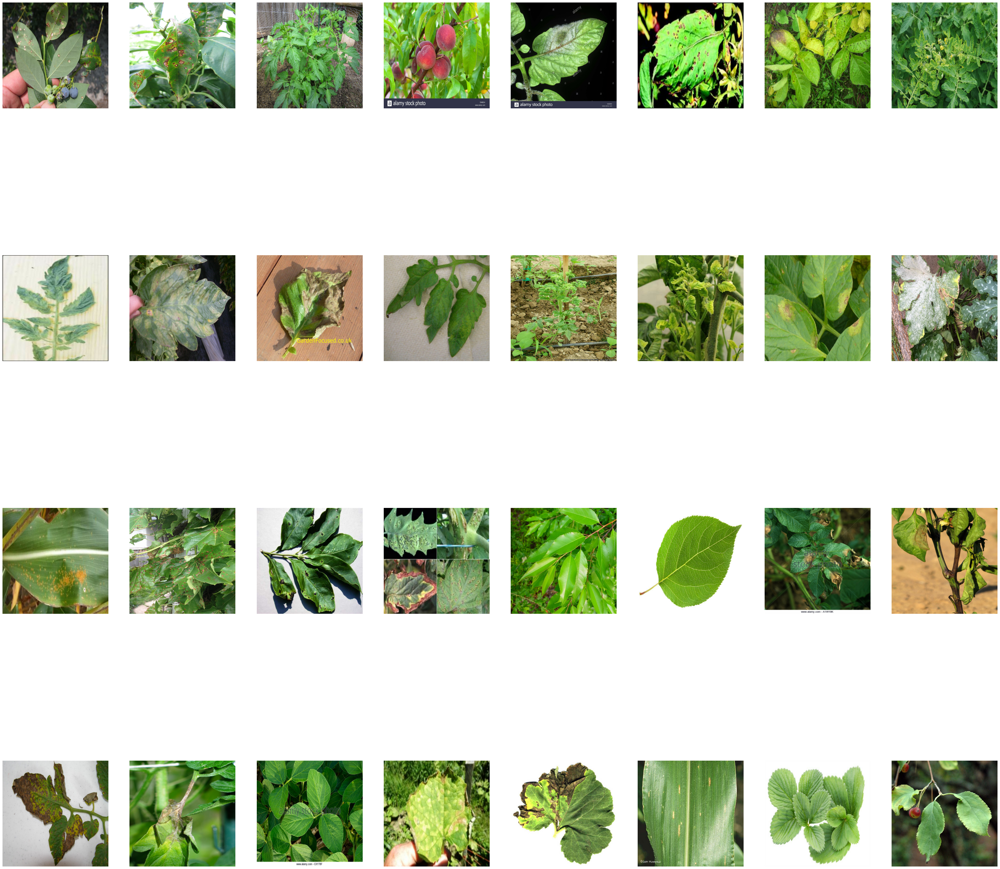

In [ ]:
import cv2
import os
from matplotlib import pyplot as plt
plt.figure(figsize=(50,50))
f9="/content/drive/MyDrive/Data/TRAIN/images"
for image_batch,label_batch in dataset_train.take(1):
  for i in range(32):
    ax=plt.subplot(4,8,i+1)
    plt.imshow(image_batch[i].numpy().astype("uint8"))
    plt.axis('off')

# Data Augmentation

In [ ]:
data_augmentation=tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2)
])

# Converting xml file to yolo format

In [ ]:
import xml.etree.ElementTree as ET
import glob
import os
import json


In [ ]:
def xml_to_yolo_bbox(bbox, w, h):
    # xmin, ymin, xmax, ymax
    if w==0 or h==0:
      return [0,0,0,0]

    x_center = ((bbox[2] + bbox[0]) / 2) / w
    y_center = ((bbox[3] + bbox[1]) / 2) / h
    width = (bbox[2] - bbox[0]) / w
    height = (bbox[3] - bbox[1]) / h
    return [x_center, y_center, width, height]

In [ ]:
def yolo_to_xml_bbox(bbox, w, h):
    # x_center, y_center width heigth
    w_half_len = (bbox[2] * w) / 2
    h_half_len = (bbox[3] * h) / 2
    xmin = int((bbox[0] * w) - w_half_len)
    ymin = int((bbox[1] * h) - h_half_len)
    xmax = int((bbox[0] * w) + w_half_len)
    ymax = int((bbox[1] * h) + h_half_len)
    return [xmin, ymin, xmax, ymax]

In [ ]:
classes = []
input_dir = "/content/drive/MyDrive/Data/TEST/labels"
output_dir = "/content/drive/MyDrive/Data/TEST/labels_yoloformat"
image_dir = "/content/drive/MyDrive/Data/TEST/images/"

In [ ]:
# identify all the xml files in the annotations folder (input directory)
files = glob.glob(os.path.join(input_dir, '*.xml'))

In [ ]:
# for fil in files:
#     basename = os.path.basename(fil)
#     filename = os.path.splitext(basename)[0]
#     # check if the label contains the corresponding image file
#     if not os.path.exists(os.path.join(image_dir, f"{filename}.jpg")):
#         print(f"{filename} image does not exist!")
#         continue

#     result = []

#     # parse the content of the xml file
#     tree = ET.parse(fil)
#     root = tree.getroot()
#     width = int(root.find("size").find("width").text)
#     height = int(root.find("size").find("height").text)

#     for obj in root.findall('object'):
#         label = obj.find("name").text
#         # check for new classes and append to list
#         if label not in classes:
#             classes.append(label)
#         index = classes.index(label)
#         pil_bbox = [int(x.text) for x in obj.find("bndbox")]
#         yolo_bbox = xml_to_yolo_bbox(pil_bbox, width, height)
#         # convert data to string
#         bbox_string = " ".join([str(x) for x in yolo_bbox])
#         result.append(f"{index} {bbox_string}")

#     if result:
#         # generate a YOLO format text file for each xml file
#         with open(os.path.join(output_dir, f"{filename}.txt"), "w", encoding="utf-8") as f:
#             f.write("\n".join(result))

# # generate the classes file as reference
# with open('classes.txt', 'w', encoding='utf8') as f:
#     f.write(json.dumps(classes))

# Visualising bounding box

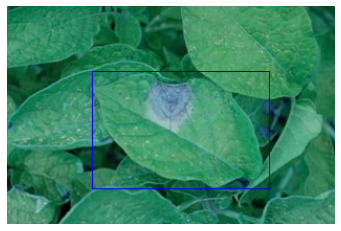

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread("/content/drive/MyDrive/Data/TRAIN/images/PotatoLateBlight2.jpg")
dh, dw, _ = img.shape

fl = open("/content/drive/MyDrive/Data/TRAIN/labels/PotatoLateBlight2.txt", 'r')
data = fl.readlines()
fl.close()
for dt in data:
    # Split string to float
    l= list(dt.split())
    _=float(l[0])
    x=float(l[1])
    y=float(l[2])
    w=float(l[3])
    h=float(l[4])

    l = int((x - w / 2) * dw)
    r = int((x + w / 2) * dw)
    t = int((y - h / 2) * dh)
    b = int((y + h / 2) * dh)

    if l < 0:
        l = 0
    if r > dw - 1:
        r = dw - 1
    if t < 0:
        t = 0
    if b > dh - 1:
        b = dh - 1

    cv2.rectangle(img, (l, t), (r, b), (0, 0, 255), 1)

plt.imshow(img)
plt.axis('off')
plt.show()

Cloning yolo model

In [ ]:
#!git clone https://github.com/ultralytics/yolov5

In [ ]:
# %cd /content/drive/MyDrive/Data/yolov5

Extracting requirements

In [ ]:
!pip install -r requirements.txt

ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


In [ ]:
# !pip install torch==1.6.0+cu101 torchvision==0.7.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

In [ ]:
!pip install google-utils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import torch
from IPython.display import Image  # for displaying images
print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

torch 1.13.1+cu116 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
%cd '/content/drive/MyDrive/Data/yolov5'

/content/drive/MyDrive/Data/yolov5


In [ ]:


gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)


Fri Feb 24 06:28:06 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   75C    P0    38W /  70W |   1306MiB / 15360MiB |     96%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!python train.py --img 640 --batch 16 --epochs 400 --data coco.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

train: weights=, cfg=./models/custom_yolov5s.yaml, data=coco.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=400, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 36 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1

In [ ]:
# !python train.py --img 640 --batch 10 --epochs 300 --data coco.yaml --weights yolov5s.pt --cache

In [ ]:

# %reload_ext tensorboard
# %tensorboard --logdir runs

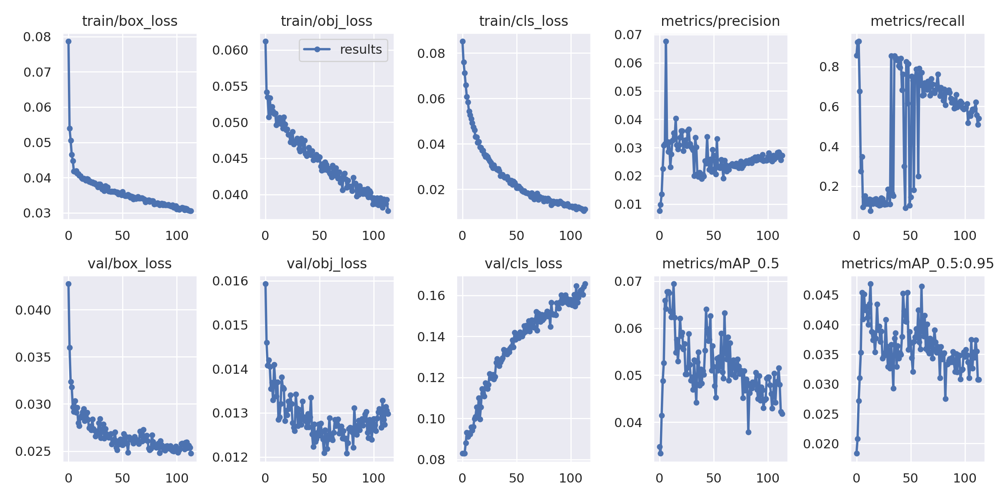

In [ ]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/drive/MyDrive/Data/yolov5/runs/train/exp34/results.png', width=1000)

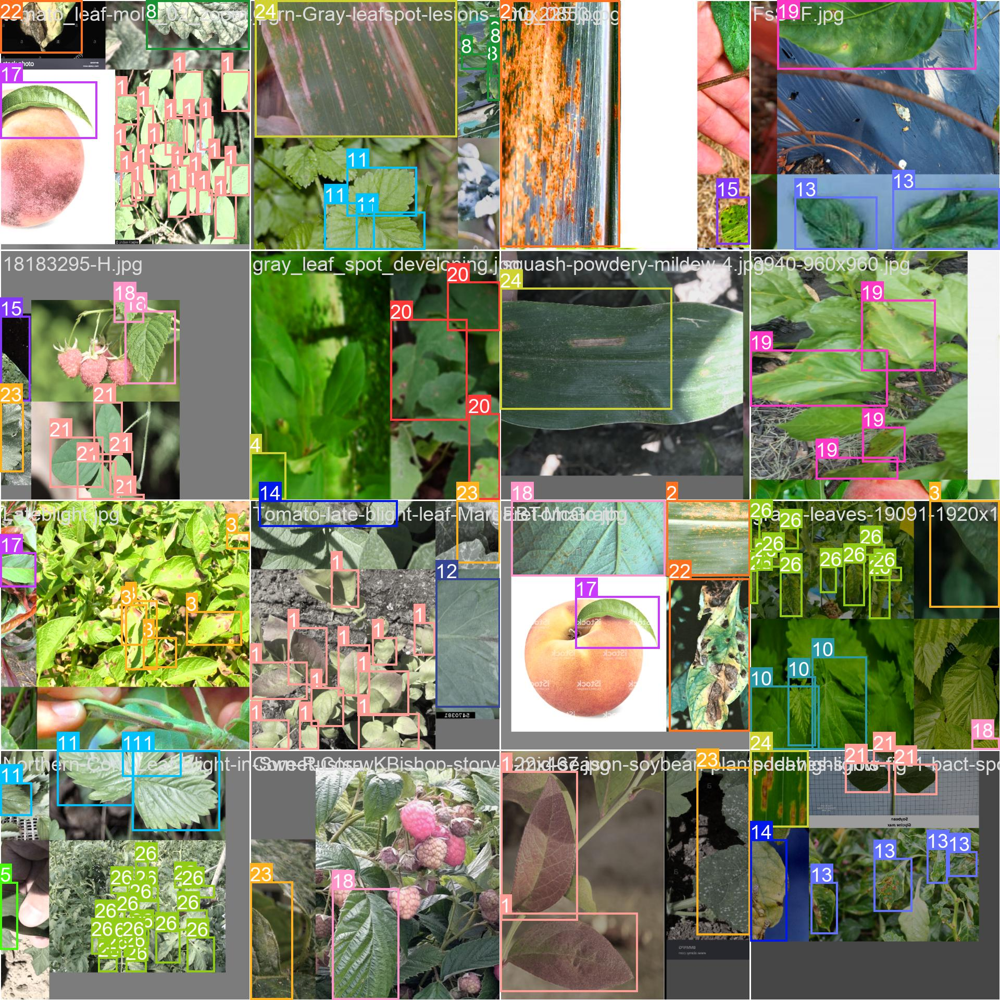

In [ ]:
Image(filename="/content/drive/MyDrive/Data/yolov5/runs/train/yolov5s_results3/train_batch1.jpg",width=1000)

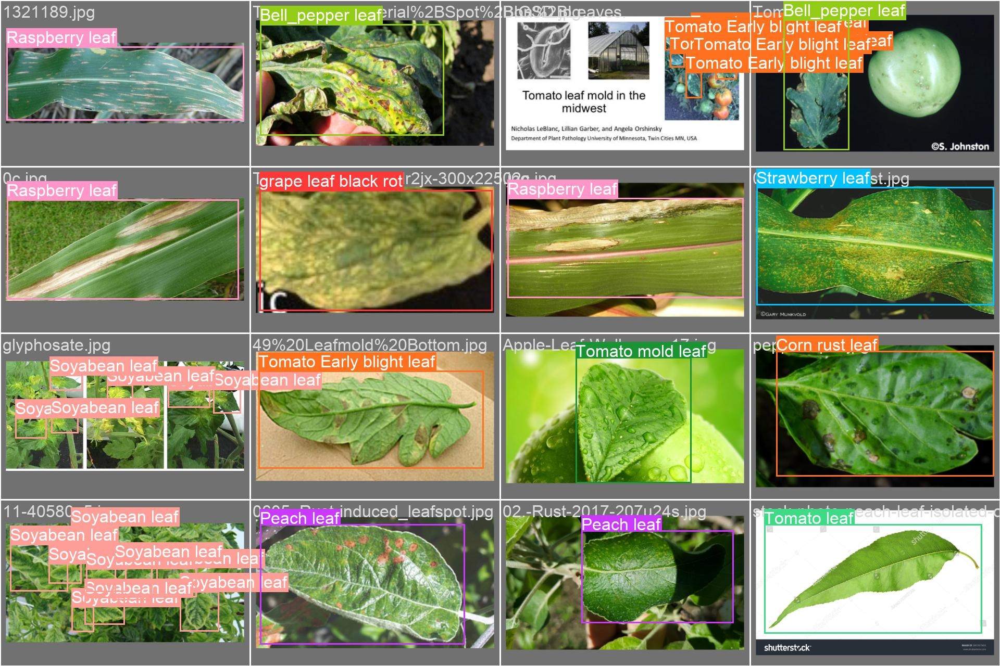

In [ ]:
Image(filename='/content/drive/MyDrive/Data/yolov5/runs/train/yolov5s_results3/val_batch0_labels.jpg', width=1000)

In [ ]:

!python detect.py --weights '/content/drive/MyDrive/Data/yolov5/runs/train/yolov5s_results3/weights/best.pt' --img 640 --conf 0.05 --source '/content/drive/MyDrive/Data/TEST/images'

detect: weights=['/content/drive/MyDrive/Data/yolov5/runs/train/yolov5s_results3/weights/best.pt'], source=/content/drive/MyDrive/Data/TEST/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.05, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7322034 parameters, 0 gradients
image 1/237 /content/drive/MyDrive/Data/TEST/images/%2320+Bacterial+Spot+and+Speck.jpg: 480x640 1 Potato leaf early blight, 3 Tomato Septoria leaf spots, 22.1ms
image 2/237 /content/drive/MyDrive/Data/TEST/images/0.jpg: 480x640 2 Potato leaf early blights, 2 Tomato Septoria leaf spo

In [ ]:

!python detect.py --weights '/content/drive/MyDrive/Data/yolov5/runs/train/yolov5s_results3/weights/best.pt' --img 640 --conf 0.2 --source '/content/drive/MyDrive/Data/TEST/images'

detect: weights=['/content/drive/MyDrive/Data/yolov5/runs/train/yolov5s_results3/weights/best.pt'], source=/content/drive/MyDrive/Data/TEST/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7322034 parameters, 0 gradients
image 1/237 /content/drive/MyDrive/Data/TEST/images/%2320+Bacterial+Spot+and+Speck.jpg: 480x640 1 Tomato Septoria leaf spot, 25.3ms
image 2/237 /content/drive/MyDrive/Data/TEST/images/0.jpg: 480x640 (no detections), 19.2ms
image 3/237 /content/drive/MyDrive/Data/TEST/images/00.jpg: 4

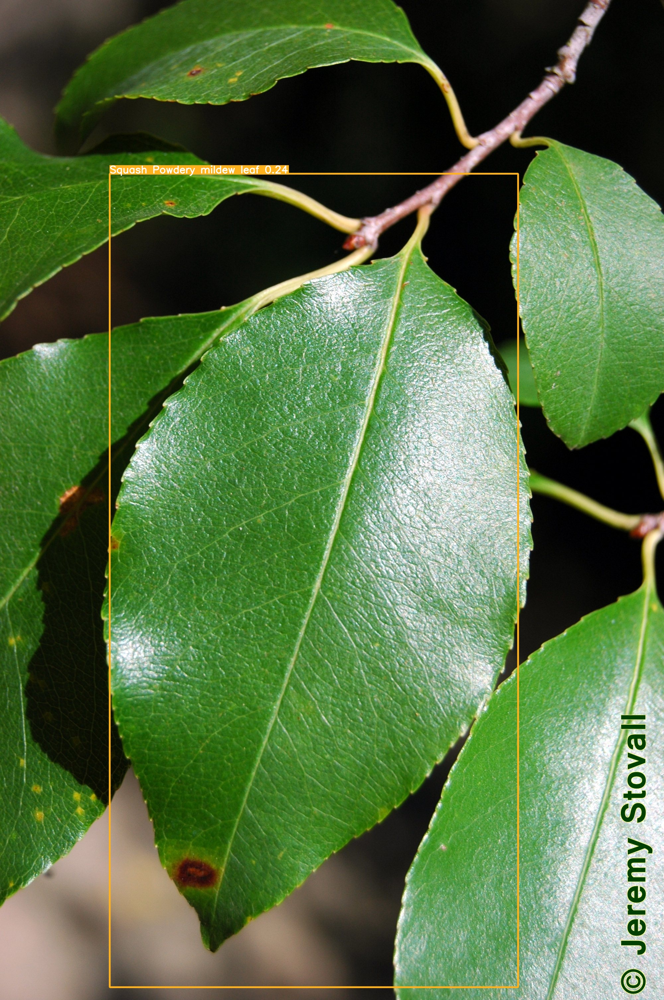

In [ ]:
Image(filename='/content/drive/MyDrive/Data/yolov5/runs/detect/exp16/prunsero_leaf2.jpg',width=500)